# Predictions of Airbnb prices for first time hosts located at Rio de Janeiro, Brazil

At the Airbnb platform, anyone who has a room or a property of any type (apartment, house, etc.) can offer their property to be rented daily/montlhly.

You create a host profile (person who makes a property available for rent per night) and create your property listing.

In this case, the host should describe the properties of the property as completely as possible, in order to help the tenant to choose the best property for them (and in order to make your ad more attractive)

There are dozens of possible customizations in your listing, from minimum daily rate, price, number of rooms, to cancellation rules, extra fee for extra guests, requirement to verify the landlord's identity, etc.

### Our goal

The goal here is to help new hosts to guess their prices based on a Machine Learning Model. Here we assume that the host does not have more than 6 properties to register on Airbnb.

### Data source:  https://www.kaggle.com/allanbruno/airbnb-rio-de-janeiro

### Libraries and dataframe

In [1]:
#libraries for dataframes
import pandas as pd
import pathlib
import numpy as np
import seaborn as sns


from matplotlib import pyplot as plt
import plotly.graph_objects as go 
import plotly.figure_factory as ff
import plotly.express as px



#This blocks imports everything needed from sklearn(models, procession packages, and metrics)
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from sklearn.linear_model import LinearRegression, SGDRegressor, Lasso, ElasticNet
from sklearn.ensemble import RandomForestRegressor, ExtraTreesRegressor
from sklearn.svm import SVR, LinearSVR
from sklearn.naive_bayes import GaussianNB
from sklearn.tree import DecisionTreeRegressor

from xgboost import XGBRegressor # XGB regression model
import plotly.express as px #Module for dynamic data visualization

### Importing and creating the dataframe


In our case, the dataset is based on a folder with several files. 

Assuming here that the mounths of the year can influence the final price, meaning that, in different seasons the price change.

In order to test if the months of the year will influence the prices, we create here a dictionary with the months of the year. Later, we move is to include this in the dataset. 

# Building the AirBnd dataframe


In [2]:
#libraries for dataframes
import pandas as pd
import pathlib

# by looking at the dataset folder we can easily identify the month name at file name.

months = {'jan':1, 'fev':2,'mar':3,'abr':4,'mai':5,'jun':6,'jul':7,'ago':8,'set':9,'out':10,'nov':11,'dez':12}

path_dataset = pathlib.Path('dataset')

df_airbnd = pd.DataFrame()

for file in path_dataset.iterdir():
    name_month = file.name[:3]#extracting the month name from file name
    month = months[name_month]#month number at the dictionary
    
    year = file.name[-8:]
    year = int(year.replace('.csv',''))
    
    df = pd.read_csv(path_dataset / file.name, low_memory=False)
    df['year'] = year
    df['month'] =  month
    df_airbnd = df_airbnd.append(df)



C:\Users\diego\AppData\Local\Temp\ipykernel_20364\851408884.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_airbnd = df_airbnd.append(df)
C:\Users\diego\AppData\Local\Temp\ipykernel_20364\851408884.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_airbnd = df_airbnd.append(df)
C:\Users\diego\AppData\Local\Temp\ipykernel_20364\851408884.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_airbnd = df_airbnd.append(df)
C:\Users\diego\AppData\Local\Temp\ipykernel_20364\851408884.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_airbnd = df_airbnd.append(df)
C:\Users\diego\AppData\Local\Temp\ipykernel_20364\851408884.

In [3]:
print(f'The dataframe has {df_airbnd.shape[0]} rows and {df_airbnd.shape[1]} columns')

The dataframe has 902210 rows and 108 columns


 The dataframe has 108 columns. From now on, we have to decide what colummns will be relevant for ou analysis. 

# Filtering the dataframe by the amount of NaNs elements

If the a column has more than 30% of its elements NaN, I will remove from the analysis. 

In [3]:
# droping the columns that have more than 30% of NaN values.
for item in df_airbnd:
    null_values = df_airbnd[item].isnull().sum()# sum the amount of NaNs in each column.
    if (null_values / len(df_airbnd[item]))*100 >= 30:
        df_airbnd = df_airbnd.drop(item, axis=1)

In [5]:
print(f'Now, the dataframe has only {df_airbnd.shape[1]} columns')

Now, the dataframe has only 65 columns


In [7]:
print(df_airbnd.columns)

Index(['id', 'listing_url', 'scrape_id', 'last_scraped', 'name', 'summary',
       'description', 'experiences_offered', 'picture_url', 'host_id',
       'host_url', 'host_name', 'host_since', 'host_location',
       'host_is_superhost', 'host_thumbnail_url', 'host_picture_url',
       'host_listings_count', 'host_total_listings_count',
       'host_verifications', 'host_has_profile_pic', 'host_identity_verified',
       'street', 'neighbourhood', 'neighbourhood_cleansed', 'city', 'state',
       'zipcode', 'market', 'smart_location', 'country_code', 'country',
       'latitude', 'longitude', 'is_location_exact', 'property_type',
       'room_type', 'accommodates', 'bathrooms', 'bedrooms', 'beds',
       'bed_type', 'amenities', 'price', 'guests_included', 'extra_people',
       'minimum_nights', 'maximum_nights', 'calendar_updated',
       'has_availability', 'availability_30', 'availability_60',
       'availability_90', 'availability_365', 'calendar_last_scraped',
       'number_of_

# Now, the question is: what columns should we keep for our analysis?

This question is very important because this question can be turned into the following question: what columns will influence the final price? 

For sure, the `host_listings_count` needs to be kept. Our analysis holds for new hosts with a few properties. This column informs us the amount of properties listed by a host at the plataform. Here, we assume that a new host will not hold a lot of properties on the plataform. New hosts, in this analysis, means regular people and not business companies that are managing different properties for a lot of people. 

I've decided to move forward with our analysis by keeping only the following columns: <br>

- `host_is_superhost`: Informs that if the host is a superhost (linked with the host credibility in the plataform)<br>
- `host_listings_count`: amount of properties listed by the host the plataform.<br>
- `property_type`: sort of properties listed by the host(apartment, house).<br>
- `accommodates`: the maximum amount of guests that the host allows at the propertie at the time.<br>
- `bathrooms`: amount of bathrooms.<br>
- `bedrooms`: amount of bedrooms.<br>
- `beds`: amount of beds.<br>
- `amenities`: refers to property amenities (TV, wifi, air conditioning, etc.).<br>
- `price`: price charged for a day(doesn't include promotional prices to full weeks).<br>
- `require_guest_profile_picture`: For safety measures, the host can require that the guest has a profile picture.<br>
- `require_guest_phone_verification`: if the host requires that the guest has the phone number verified(safety measure).<br>
- `month`: month it was scraped from the web.<br>
- `year`: month it was scraped from the web.<br>
- `security_deposit`: if the host requires a safety deposit in case anything breaks.<br>
- `cleaning_fee`: if the host requires a cleaning fee, charged everytime a listing is rented.

### Dropping the missing values in each column.

- By looking at the original dataset, we realize that there are lot of data missing. 
- Now we will delete the NaN data that we still have in our dataset.


In [4]:
dropped_cols = ['id','listing_url','scrape_id','last_scraped','last_scraped','name','summary','description','experiences_offered','picture_url','host_id','host_url','host_name','host_since','host_location','host_thumbnail_url','host_picture_url','host_total_listings_count','host_verifications','host_has_profile_pic','host_identity_verified','street','neighbourhood','neighbourhood_cleansed','city','state','zipcode','market','smart_location','country_code','country','is_location_exact','room_type','calendar_updated','has_availability','availability_30','availability_60','availability_90','availability_365','calendar_last_scraped','requires_license','require_guest_profile_picture','require_guest_phone_verification','calculated_host_listings_count']    

df_airbnd = df_airbnd.drop(dropped_cols, axis=1)

print(f'Now, the dataframe has {df_airbnd.shape[0]} rows and {df_airbnd.shape[1]} colunms.')

Now, the dataframe has 902210 rows and 22 colunms.


### Dropping the missing values in each column.

In [5]:
# delete all NaN datas
df_airbnd = df_airbnd.dropna()#delete all the NaN data from the dataframe

print(f'Now, the dataframe has {df_airbnd.shape[0]} rows and {df_airbnd.shape[1]} colunms.')

Now, the dataframe has 897709 rows and 22 colunms.


### Checking the data type

In [5]:
#data type
print(df_airbnd.dtypes)
print('-'*60)
print(df_airbnd.iloc[0])

host_is_superhost            object
host_listings_count         float64
latitude                    float64
longitude                   float64
property_type                object
accommodates                  int64
bathrooms                   float64
bedrooms                    float64
beds                        float64
bed_type                     object
amenities                    object
price                        object
guests_included               int64
extra_people                 object
minimum_nights                int64
maximum_nights                int64
number_of_reviews             int64
instant_bookable             object
is_business_travel_ready     object
cancellation_policy          object
year                          int64
month                         int64
dtype: object
------------------------------------------------------------
host_is_superhost                                                           f
host_listings_count                                    

In [6]:
import numpy as np

# price: It should be a float a not an object.Thus, we have to change.
df_airbnd['price'] = df_airbnd['price'].str.replace('$','').str.replace(',','')
df_airbnd['price'] = df_airbnd['price'].astype(np.float32, copy=False) 

print(df_airbnd['price'].dtypes)

#extra_people: It should be a float a not an object.Thus, we have to change.
df_airbnd['extra_people'] = df_airbnd['extra_people'].str.replace('$','').str.replace(',','')
df_airbnd['extra_people'] = df_airbnd['extra_people'].astype(np.float32, copy=False)

print(df_airbnd['extra_people'].dtypes)

C:\Users\diego\AppData\Local\Temp\ipykernel_20364\1682627447.py:4: FutureWarning: The default value of regex will change from True to False in a future version. In addition, single character regular expressions will *not* be treated as literal strings when regex=True.
  df_airbnd['price'] = df_airbnd['price'].str.replace('$','').str.replace(',','')


float32


C:\Users\diego\AppData\Local\Temp\ipykernel_20364\1682627447.py:10: FutureWarning: The default value of regex will change from True to False in a future version. In addition, single character regular expressions will *not* be treated as literal strings when regex=True.
  df_airbnd['extra_people'] = df_airbnd['extra_people'].str.replace('$','').str.replace(',','')


float32


### Outliers Analysis

    1. Check the correlation between the features and decide if we keep all the features that we have.
    
    2. Delete outliers. As a rule, values lower than Q1 - 1.5xAmplitute and values greater than Q3 + 1.5xAmplitute,             where the amplitute reads as Amplitute = Q3 - Q1. The goal here is to set regions where we can find values that can contribute to our model, i.e., different limits, lower limit and an upper limit. The idea is not to take into account the whole interval. The idea is to restrict the data to a certain interval. Lower limit is Q1 - 1.5xAmplitute = Q1 - 1.5x(Q3 -Q1) = 2.5Q1 - 1.5Q3; 
        
    3. Check if all the features that we have make sense for our model and if not all of them we have to decide if we delete a a part or not.

# Correlation heatmap

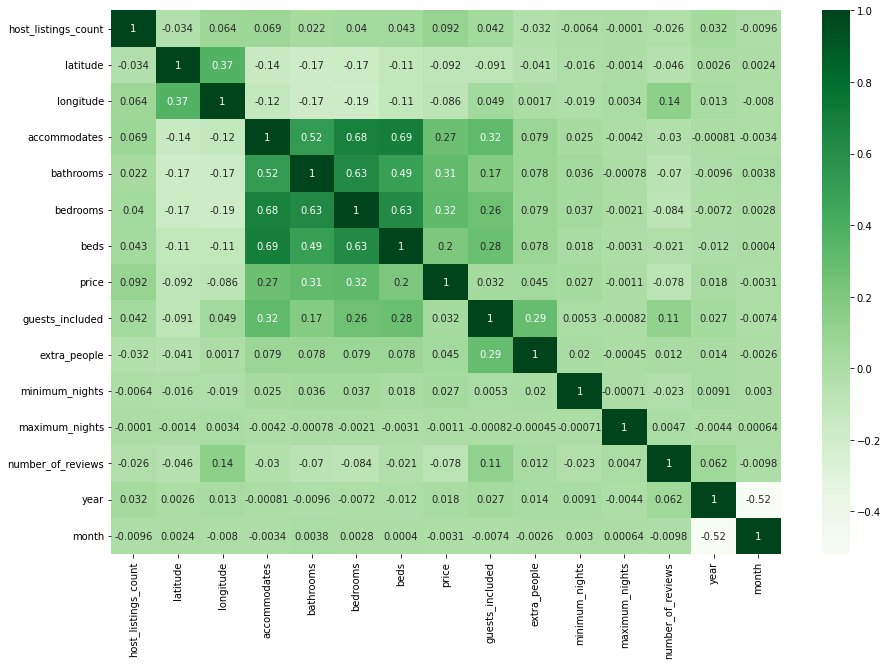

In [9]:
from matplotlib import pyplot as plt
import seaborn as sns



# pandas tem uma função de correlação. .corr() base_airbnd.corr() vai correlacionar as colunas da base.
plt.figure(figsize =(15, 10)) #tamanho do gráfico
sns.heatmap(df_airbnd.corr(), annot=True, cmap = 'Greens' )#mapa de calor da correlação entre as colunas da base;
# annot = True é para dar a descrição do gráfico; cmap é para mudara cor do gráfico de calor

plt.show()

### Functions to deal with the outliers 

In this analysis, we use the Interquartile range.

In [7]:
def upper_lower_fences(column):
    q1 = column.quantile(0.25)
    q3 = column.quantile(0.75)
    amplitude = q3 - q1
    return q1 -1.5 * amplitude, q3 + 1.5 * amplitude #returns the lower and upper fences

def delete_outliers(df, column_name):
    amount_rows = df.shape[0]
    fences_low, fences_upp = upper_lower_fences(df[column_name])
    df = df.loc[(df[column_name] >= fences_low) & (df[column_name] <= fences_upp), :]
    removed_rows = amount_rows - df.shape[0] 
    return df, removed_rows

In [8]:
def box_plot(column):
    fig, (ax1,ax2) = plt.subplots(1,2)
    fig.set_size_inches(15,5)
    sns.boxplot(x=column,ax=ax1)
    ax2.set_xlim(upper_lower_fences(column))
    sns.boxplot(x=column,ax=ax2)

def histogram(column):
    plt.figure(figsize =(15, 5))
    sns.distplot(column, hist = True)

def bar_plot(column):
    plt.figure(figsize =(15, 5))
    ax = sns.barplot(x = column.value_counts().index, y = column.value_counts())
    ax.set_xlim(upper_lower_fences(column))
    

### host_listings_count


As it can be seen at the plot, values bigger than 6 are outliers. From the first plot, it can be seen that there is a huge amount of outlying data.

Since the goal of the study is to predict how regular people, with one, or a few, vacant properties price them, hosts with more than 6 properties will be deleted from the analysis (this helps removing companies that rent on Airbnb and have way more listings than usual).

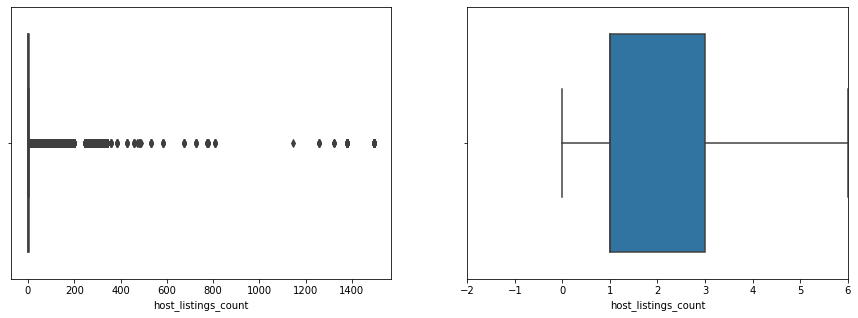

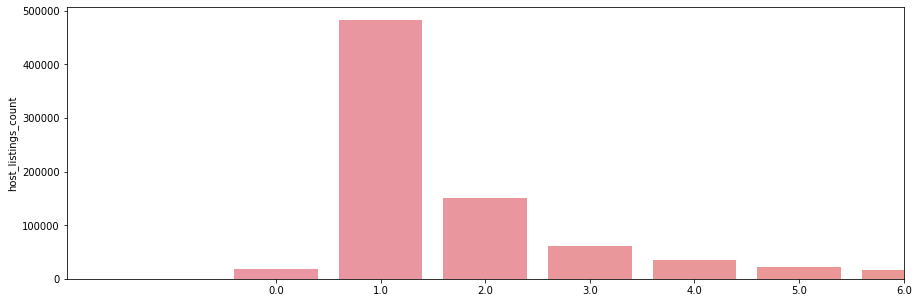

In [9]:
box_plot(df_airbnd['host_listings_count'])
bar_plot(df_airbnd['host_listings_count'])
plt.show()

In [9]:
df_airbnd, removed_rows = delete_outliers(df_airbnd,'host_listings_count')
print(f'The amount of removed rows is {removed_rows}')


The amount of removed rows is 114368


### Price

I believe that the outliers stand for luxury properties. This model has no itend to cover this target group. Therefore we can delete the outliers.

C:\Users\diego\anaconda3\envs\airbnbproject\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


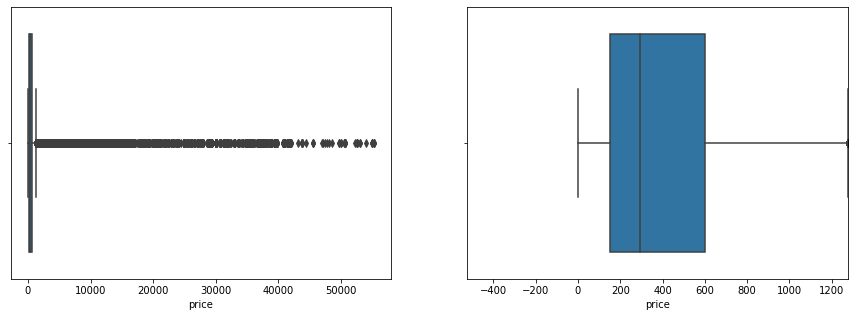

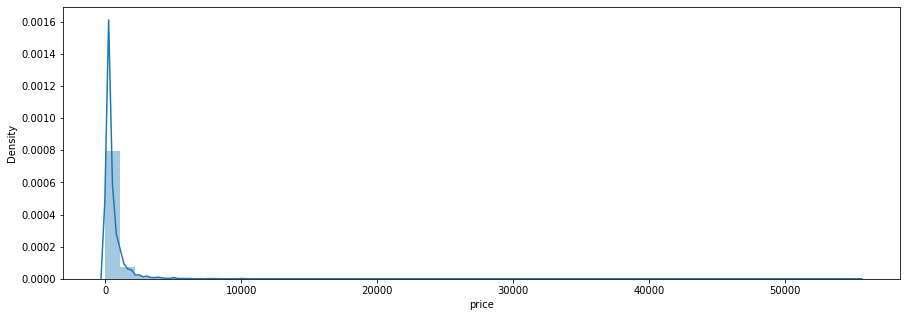

In [19]:
box_plot(df_airbnd['price'])
histogram(df_airbnd['price'])
plt.show()

In [10]:
df_airbnd, removed_rows = delete_outliers(df_airbnd,'price')
print(f'The amount of removed rows is {removed_rows}')

#base_airbnd.shape

The amount of removed rows is 75727


C:\Users\diego\anaconda3\envs\airbnbproject\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


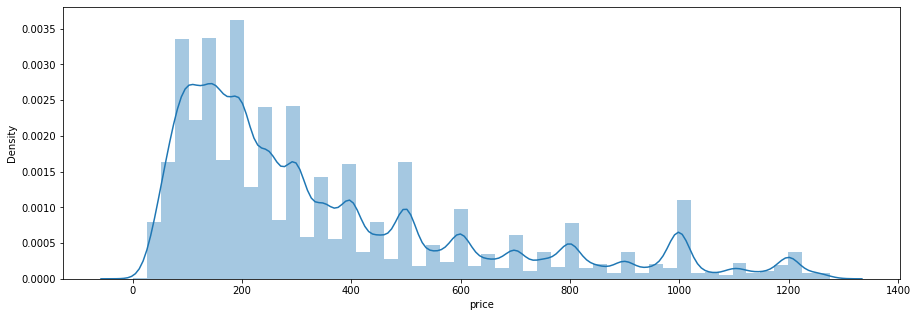

In [21]:
histogram(df_airbnd['price'])
plt.show()

### extra_people

C:\Users\diego\anaconda3\envs\airbnbproject\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


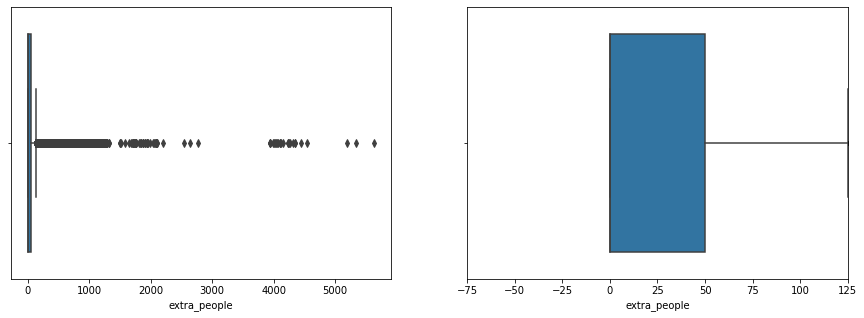

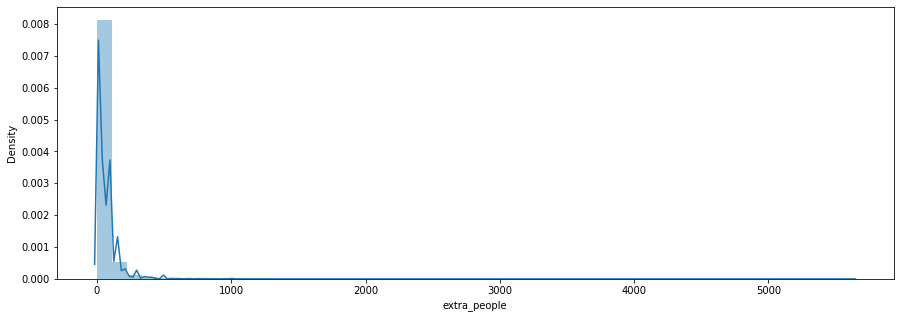

In [22]:
box_plot(df_airbnd['extra_people'])
histogram(df_airbnd['extra_people'])
plt.show()

In [11]:
df_airbnd, removed_rows = delete_outliers(df_airbnd,'extra_people')
print(removed_rows)

54104


C:\Users\diego\anaconda3\envs\airbnbproject\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


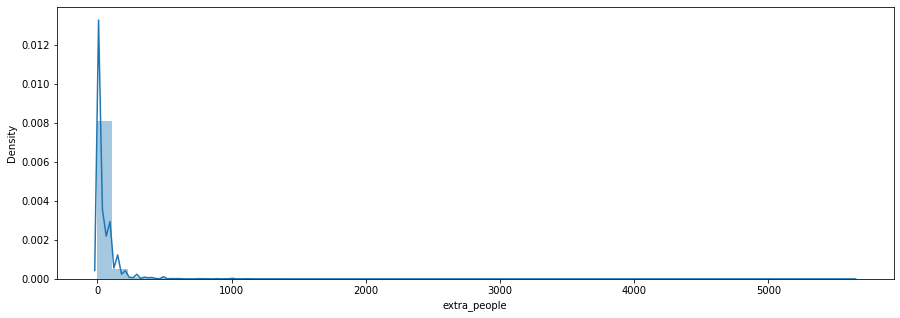

In [13]:
histogram(df_airbnd['extra_people'])
plt.show()

### Dealing the following columns

- `accommodates`
- `bathrooms`
- `bedrooms`               
- `beds`
- `guests_included`
- `minimum_nights`
- `maximum_nights`
- `number_of_reviews`


### accommodates

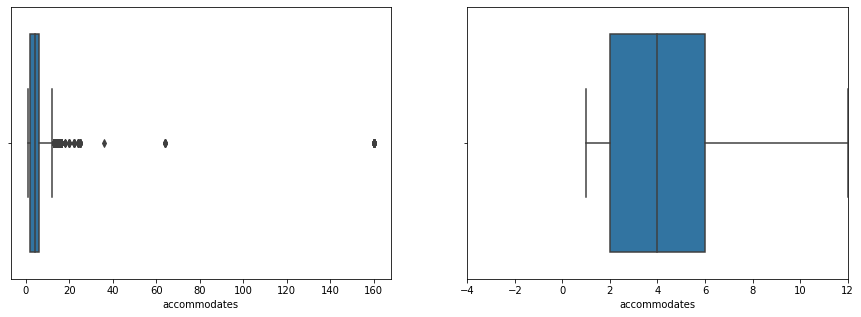

In [14]:
box_plot(df_airbnd['accommodates'])
plt.show()

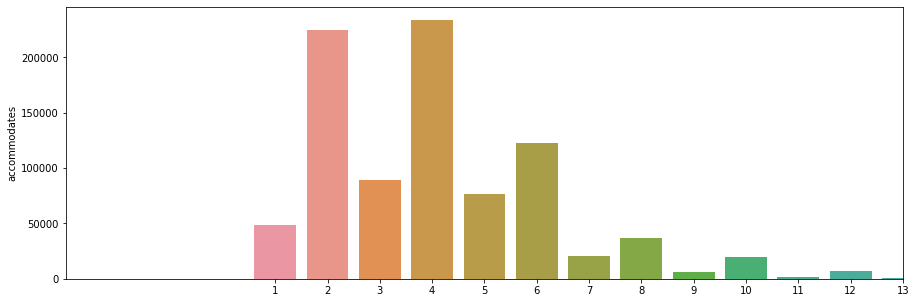

In [15]:
bar_plot(df_airbnd['accommodates'])
plt.show()

The column `accomodates` represents the amount of people that a property can accomodate. At this point, we create one more assumpition for our model. From now on, we assume that our hosts have properties that can not accomodate a lot of people. Thus we can cut the outliers.

In [12]:
df_airbnd, removed_rows = delete_outliers(df_airbnd,'accommodates')
print(f'The amount of removed rows is {removed_rows}')

The amount of removed rows is 13146


### bathrooms

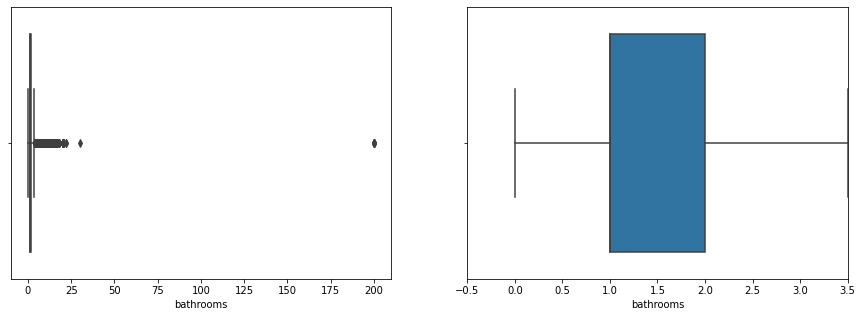

In [16]:
box_plot(df_airbnd['bathrooms'])
plt.show()

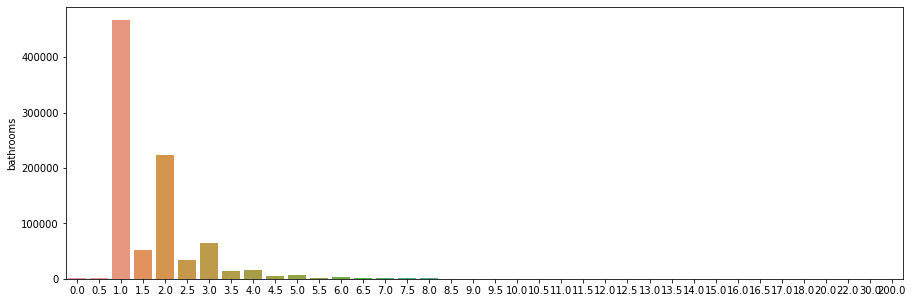

In [17]:
plt.figure(figsize=(15, 5))
sns.barplot(x=df_airbnd['bathrooms'].value_counts().index, y=df_airbnd['bathrooms'].value_counts())
plt.show()

What the hell are 3.5 bathrooms? :P But above 3.5 we can consider outlier. 

In [13]:
df_airbnd, removed_rows = delete_outliers(df_airbnd,'bathrooms')
print(removed_rows)

6894


### bedrooms

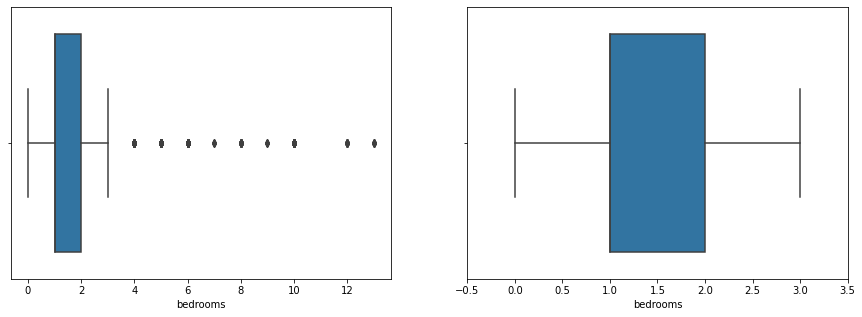

In [27]:
box_plot(df_airbnd['bedrooms'])
plt.show()

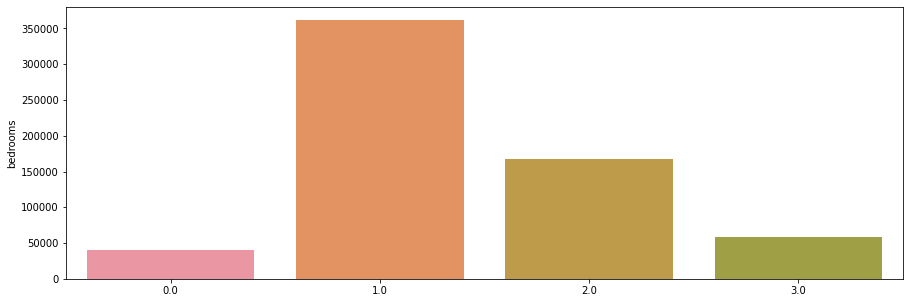

In [29]:
bar_plot(df_airbnd['bedrooms'])
plt.show()

In [32]:
print(upper_lower_fences(df_airbnd['bedrooms']))

(-0.5, 3.5)


More than 3 bedrooms is out of our scope.

In [14]:
df_airbnd, removed_rows = delete_outliers(df_airbnd,'bedrooms')
print(removed_rows)

5482


### beds

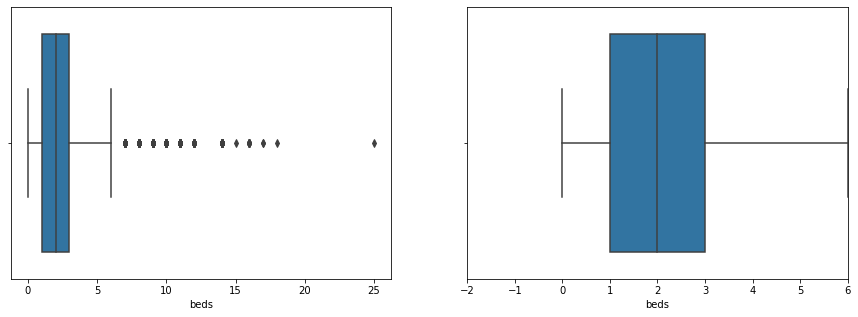

In [37]:
box_plot(df_airbnd['beds'])
plt.show()

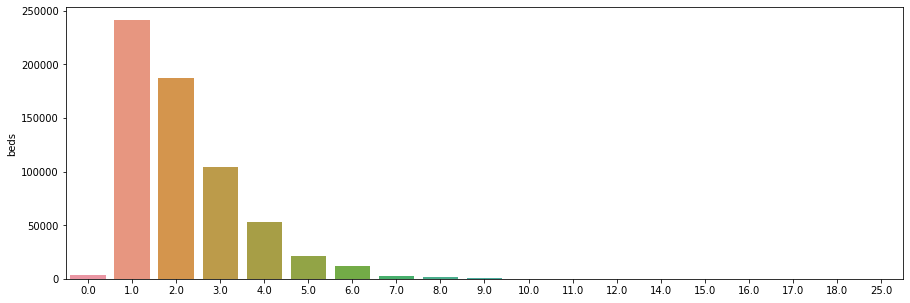

In [36]:
plt.figure(figsize=(15, 5))
sns.barplot(x=df_airbnd['beds'].value_counts().index, y=df_airbnd['beds'].value_counts())
plt.show()

In [35]:
print(upper_lower_fences(df_airbnd['beds']))

(-2.0, 6.0)


More than 3 beds is out of our scope.

In [15]:
df_airbnd, removed_rows = delete_outliers(df_airbnd,'beds')
print(removed_rows)

5622


### guests_included

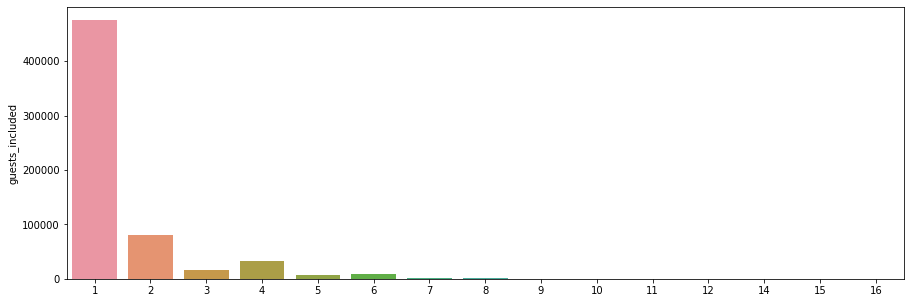

In [39]:
#diagrama_caixa(base_airbnd['guests_included'])
#grafico_barra(base_airbnd['guests_included'])
plt.figure(figsize=(15, 5))
sns.barplot(x=df_airbnd['guests_included'].value_counts().index, y=df_airbnd['guests_included'].value_counts())
plt.show()


In [40]:
print(upper_lower_fences(df_airbnd['guests_included']))

(1.0, 1.0)


- Let's remove this feature from our analysis. It seems that airbnb users use the default airbnb value as 1 guest included a lot. This can lead our model to consider a feature that is actually not essential for pricing, so it seems better to remove the column from the analysis.

In [16]:
df_airbnd = df_airbnd.drop('guests_included', axis=1)
df_airbnd.shape

#base_airbnd['guests_included']

(622366, 21)

### minimum_nights

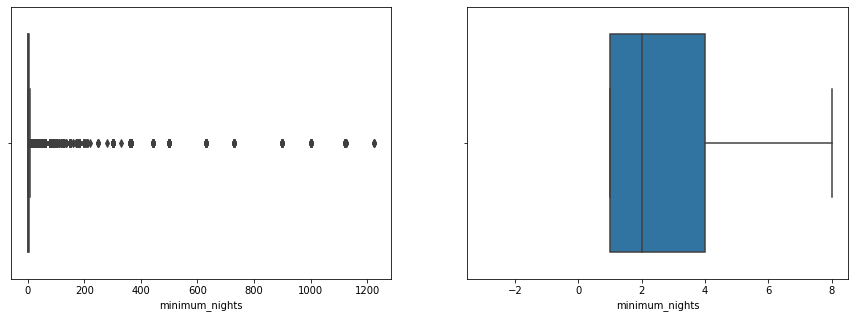

In [42]:
box_plot(df_airbnd['minimum_nights'])
plt.show()

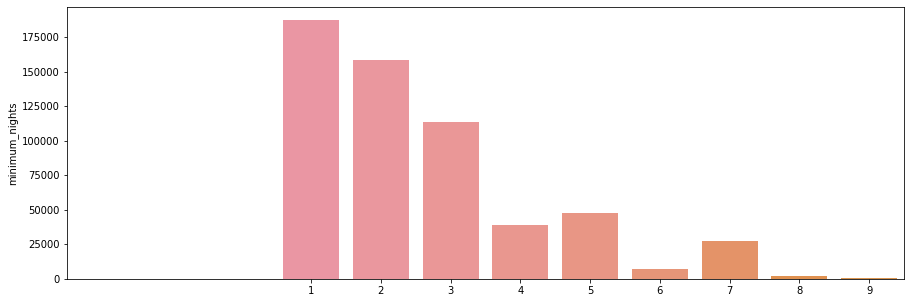

In [44]:
bar_plot(df_airbnd['minimum_nights'])
plt.show()


In [46]:
print(upper_lower_fences(df_airbnd['minimum_nights']))

(-3.5, 8.5)


- We are looking for a model that helps to find the price for ordinary apartments (not luxury ones). In this case, apartments with more than 8 nights as the "minimum of nights" can be seasonal apartments or apartments to live in, where the host requires at least 1 month in the apartment. Because of this we will cut the outliers. 

In [17]:
df_airbnd, removed_rows = delete_outliers(df_airbnd,'minimum_nights')
print(removed_rows)

40383


### maximum_nights

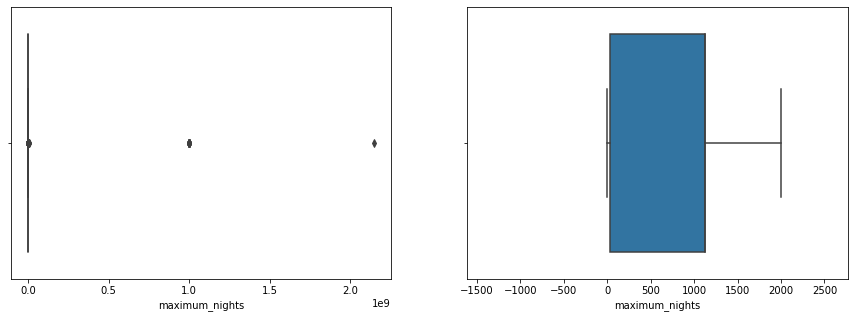

In [49]:
box_plot(df_airbnd['maximum_nights'])
plt.show()

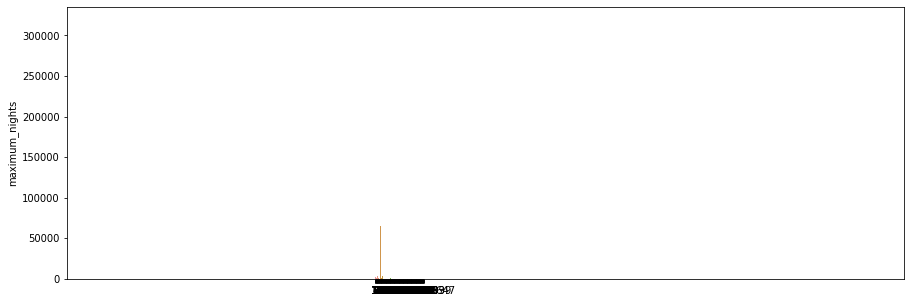

In [50]:
bar_plot(df_airbnd['maximum_nights'])
plt.show()

In [52]:
print(upper_lower_fences(df_airbnd['maximum_nights']))

(-1612.5, 2767.5)


- This column doesn't seem to help our analysis.

- That's because it seems that almost all hosts don't fill in this maximum nights field. Much of the data is at zero.

- Therefore, it doesn't seem to be a relevant factor to our model.

- It is better to remove this column from the analysis.

In [18]:
df_airbnd = df_airbnd.drop('maximum_nights', axis=1)
df_airbnd.shape


(581983, 20)

### number_of_reviews

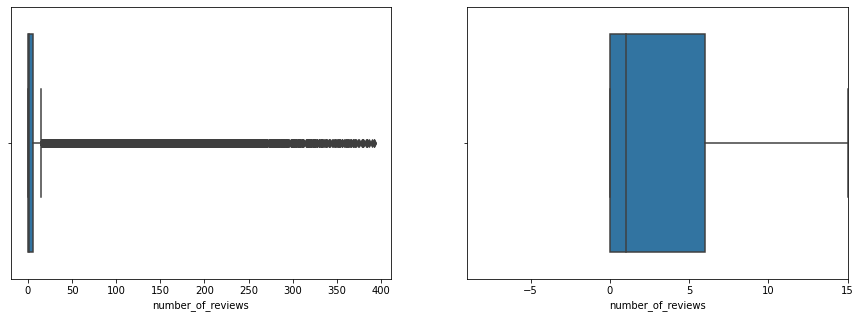

In [56]:
box_plot(df_airbnd['number_of_reviews'])
plt.show()

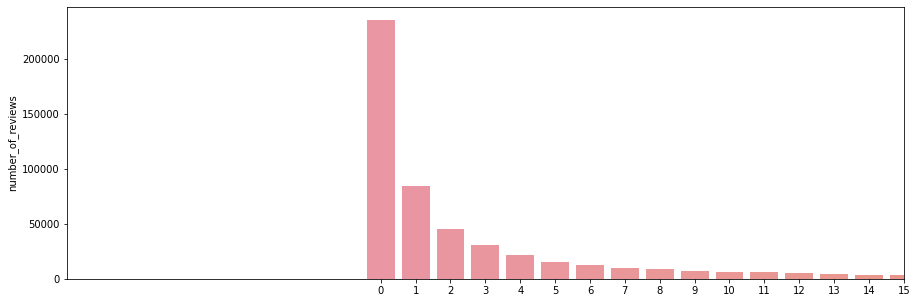

In [57]:
bar_plot(df_airbnd['number_of_reviews'])
plt.show()

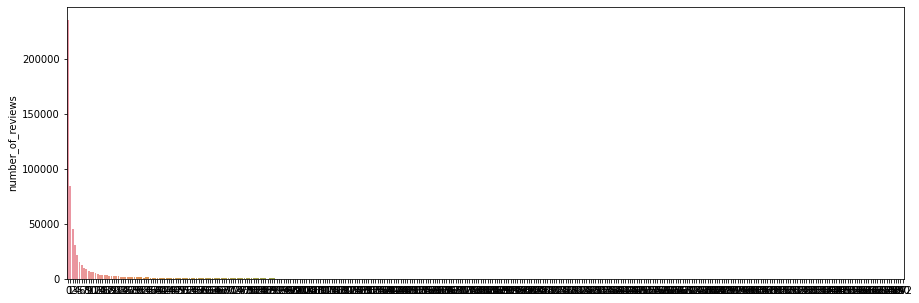

In [59]:
plt.figure(figsize=(15, 5))
sns.barplot(x=df_airbnd['number_of_reviews'].value_counts().index, y=df_airbnd['number_of_reviews'].value_counts())
plt.show()

In [61]:
print(upper_lower_fences(df_airbnd['number_of_reviews']))

(-9.0, 15.0)


- I believe that number_of_reviews needs to be dropped from the analysis. From my perspective, we do not have enough data to check if these are good reviews or bad reviews and the influence on the price.

In [19]:
df_airbnd = df_airbnd.drop('number_of_reviews', axis=1)
df_airbnd.shape


(581983, 19)

### Dealing with the columns with object type data

### property_type

- Here, we will create categories and analyze them. We need to know how many records there are for each property_type to know if it's worth keeping that category or not. 

In [63]:
print(df_airbnd['property_type'].value_counts())

Apartment                 458354
House                      51387
Condominium                26456
Serviced apartment         12671
Loft                       12352
Guest suite                 3621
Bed and breakfast           3472
Hostel                      2665
Guesthouse                  2155
Other                       1957
Villa                       1294
Townhouse                    969
Aparthotel                   693
Chalet                       481
Earth house                  468
Tiny house                   457
Boutique hotel               447
Hotel                        376
Casa particular (Cuba)       298
Cottage                      230
Bungalow                     207
Dorm                         185
Cabin                        141
Nature lodge                 124
Castle                        80
Treehouse                     76
Island                        54
Boat                          53
Hut                           40
Campsite                      34
Resort    

Apartment                 458354
House                      51387
Condominium                26456
Serviced apartment         12671
Loft                       12352
Guest suite                 3621
Bed and breakfast           3472
Hostel                      2665
Guesthouse                  2155
Other                       1957
Villa                       1294
Townhouse                    969
Aparthotel                   693
Chalet                       481
Earth house                  468
Tiny house                   457
Boutique hotel               447
Hotel                        376
Casa particular (Cuba)       298
Cottage                      230
Bungalow                     207
Dorm                         185
Cabin                        141
Nature lodge                 124
Castle                        80
Treehouse                     76
Island                        54
Boat                          53
Hut                           40
Campsite                      34
Resort    

C:\Users\diego\anaconda3\envs\airbnbproject\lib\site-packages\seaborn\_decorators.py:36: FutureWarning:

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



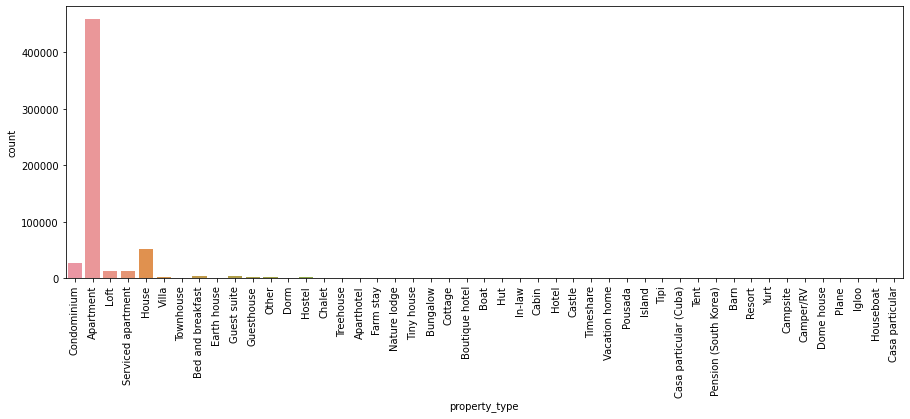

In [64]:
print(df_airbnd['property_type'].value_counts())
plt.figure(figsize=(15,5))
grafico = sns.countplot('property_type', data = df_airbnd)
grafico.tick_params(axis='x', rotation=90)
plt.show()

As it can be seen in this plot, the largest contributions come from the first columns. The idea is to group everything that comes after dorm like we did with the other.

C:\Users\diego\anaconda3\envs\airbnbproject\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


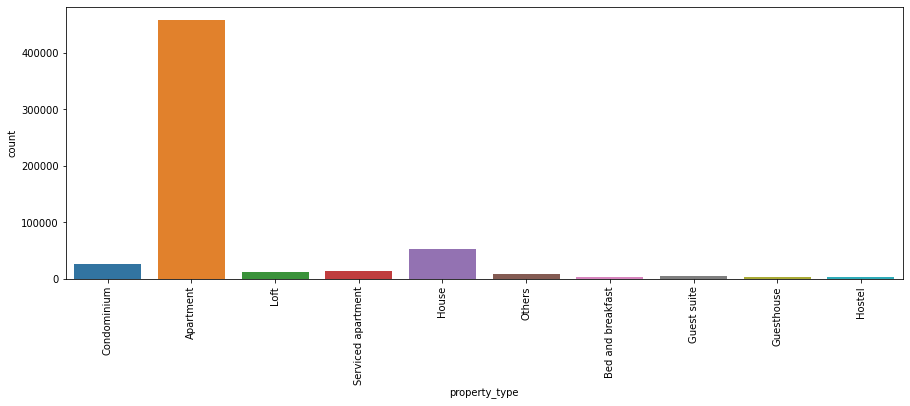

In [20]:
tabela_tipos_casa = df_airbnd['property_type'].value_counts()
for item in tabela_tipos_casa.index:
    if int(tabela_tipos_casa[f'{item}']) < 2000:
        df_airbnd['property_type'] = df_airbnd['property_type'].replace(f'{item}', 'Others')

plt.figure(figsize=(15,5))
grafico = sns.countplot('property_type', data = df_airbnd)
grafico.tick_params(axis='x', rotation=90)
plt.show()

- room_type

In [21]:
print(df_airbnd['room_type'].value_counts())
plt.figure(figsize=(15,5))
grafico = sns.countplot('room_type', data = df_airbnd)
grafico.tick_params(axis='x', rotation=90)
plt.show()

KeyError: 'room_type'

There is no need to group here. It is already well distributed.

 - bed_type

In [67]:
print(df_airbnd['bed_type'].value_counts())

Real Bed         570643
Pull-out Sofa      8055
Futon              1634
Airbed             1155
Couch               496
Name: bed_type, dtype: int64


C:\Users\diego\anaconda3\envs\airbnbproject\lib\site-packages\seaborn\_decorators.py:36: FutureWarning:

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



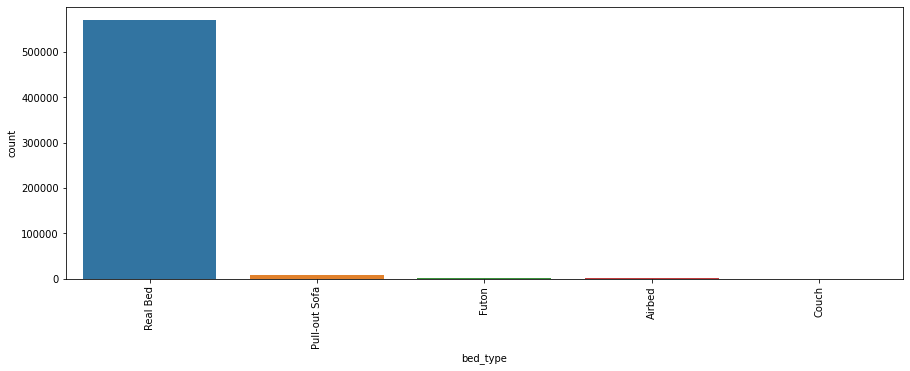

In [68]:
plt.figure(figsize=(15,5))
grafico = sns.countplot('bed_type', data = df_airbnd)
grafico.tick_params(axis='x', rotation=90)
plt.show()

In [22]:
tabela_bed = df_airbnd['bed_type'].value_counts()
for item in tabela_bed.index:
    if int(tabela_bed[f'{item}']) < 10000:
        df_airbnd['bed_type'] = df_airbnd['bed_type'].replace(f'{item}', 'Others')

Real Bed    570643
Others       11340
Name: bed_type, dtype: int64


C:\Users\diego\anaconda3\envs\airbnbproject\lib\site-packages\seaborn\_decorators.py:36: FutureWarning:

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



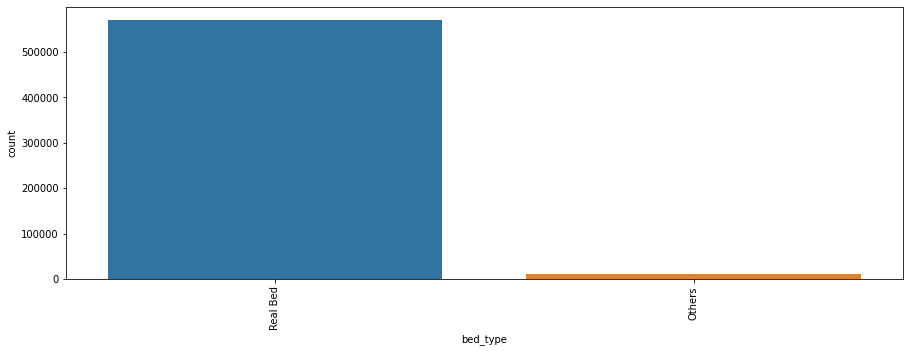

In [70]:
print(df_airbnd['bed_type'].value_counts())
plt.figure(figsize=(15,5))
grafico = sns.countplot('bed_type', data = df_airbnd)
grafico.tick_params(axis='x', rotation=90)
plt.show()

Grouped into real bed and others_bed categories.

### - cancellation_policy

flexible                       258096
strict_14_with_grace_period    200743
moderate                       113281
strict                           9696
super_strict_60                   135
super_strict_30                    32
Name: cancellation_policy, dtype: int64


C:\Users\diego\anaconda3\envs\airbnbproject\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


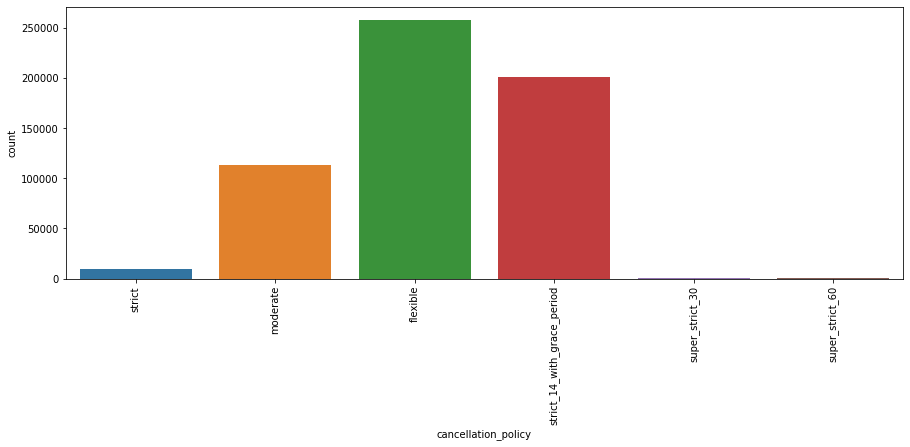

flexible                       258096
strict_14_with_grace_period    200743
moderate                       113281
strict                           9863
Name: cancellation_policy, dtype: int64


C:\Users\diego\anaconda3\envs\airbnbproject\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


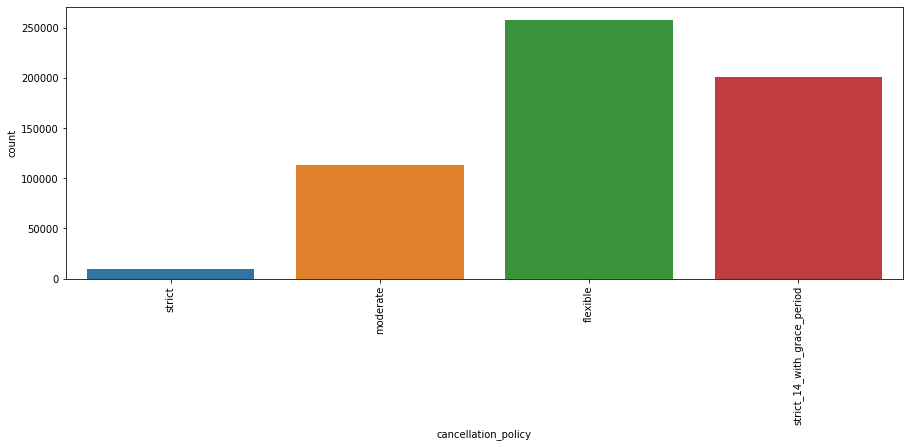

In [23]:
print(df_airbnd['cancellation_policy'].value_counts())
plt.figure(figsize=(15,5))
grafico = sns.countplot('cancellation_policy', data = df_airbnd)
grafico.tick_params(axis='x', rotation=90)
plt.show()

tabela_cancellation = df_airbnd['cancellation_policy'].value_counts()
for item in tabela_cancellation.index:
    if int(tabela_cancellation[f'{item}']) < 10000:
        df_airbnd['cancellation_policy'] = df_airbnd['cancellation_policy'].replace(f'{item}', 'strict')

print(df_airbnd['cancellation_policy'].value_counts())
plt.figure(figsize=(15,5))
grafico = sns.countplot('cancellation_policy', data = df_airbnd)
grafico.tick_params(axis='x', rotation=90)
plt.show()

### - amenities

In [ ]:
print(df_airbnd['amenities'].iloc[0])

- The idea here is not to analyze how much each item influences the price but to analyze the size of the list. The idea is that the more items you have, the more detailed the host was and that is why it is believed that the more expensive is the service charged by the host.

- As we have a very large diversity of amenities and sometimes the same amenities can be written differently, we will evaluate the amount of amenities as a parameter for our model.

In [24]:
print(df_airbnd['amenities'].iloc[1].split(',')) 
print(len(df_airbnd['amenities'].iloc[0].split(',')))

df_airbnd['n_amenities'] = df_airbnd['amenities'].str.split(',').apply(len)#cada elemento da coluna nova n_amenities vai

['{TV', '"Cable TV"', 'Internet', 'Wifi', '"Air conditioning"', 'Kitchen', 'Doorman', 'Elevator', '"Buzzer/wireless intercom"', '"Family/kid friendly"', 'Hangers', '"Hair dryer"', 'Iron', '"Laptop friendly workspace"}']
25


In [25]:
#agora é preciso remover a coluna de amenities usando o drop
df_airbnd = df_airbnd.drop('amenities', axis=1)

In [27]:
df_airbnd.shape

(581983, 19)

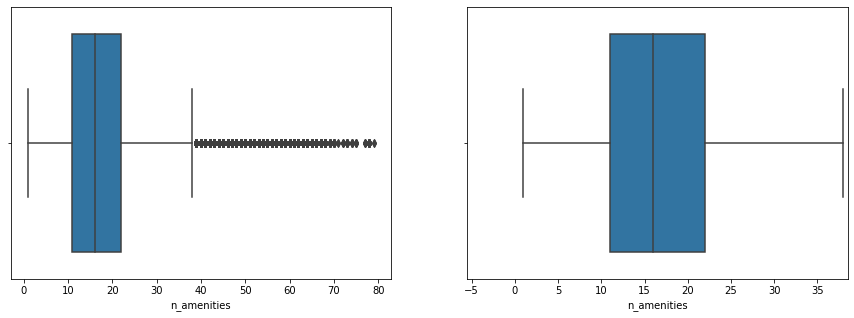

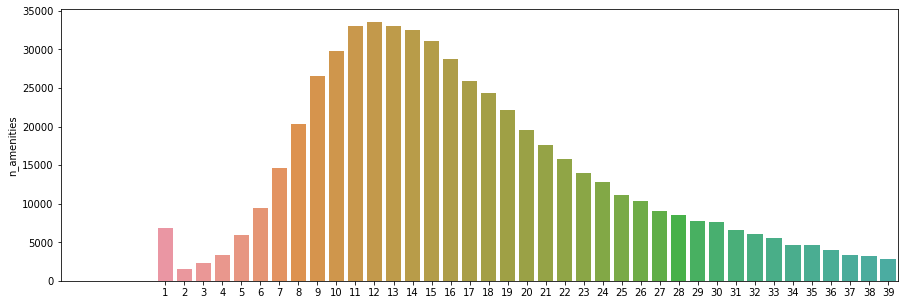

In [29]:
box_plot(df_airbnd['n_amenities'])
bar_plot(df_airbnd['n_amenities'])
plt.show()

In [30]:
df_airbnd, removed_rows = delete_outliers(df_airbnd, 'n_amenities')
print(removed_rows)

24343


### Porperties in a map

In [52]:
amostra = df_airbnd.sample(n=100000)#a ideia aqui é pegar apenas uma amostra dos dados para diminuir a densidade do mapa
centro_mapa = {'lat':amostra.latitude.mean(), 'lon':amostra.longitude.mean()}
mapa = px.density_mapbox(amostra, lat='latitude', lon='longitude',z='price', radius=10,
                        center=centro_mapa, zoom=10,
                        mapbox_style='stamen-terrain',color_continuous_scale= [

                [0.0, "green"],

                [0.5, "green"],

                [0.51111111, "yellow"],

                [0.71111111, "yellow"],

                [0.71111112, "red"],

                [1, "red"]],

                        opacity = 0.5)
mapa.show()

In [50]:
#COORDINATES TO PLOT THE MAP
box = (df_airbnd.longitude.min(), df_airbnd.longitude.max(), df_airbnd.latitude.min(), df_airbnd.latitude.max())
box1 = (-43.7370,-43.1041,-23.0729,-22.7497)

C:\Users\diego\AppData\Local\Temp\ipykernel_20364\1683644064.py:3: MatplotlibDeprecationWarning:

Directly reading images from URLs is deprecated since 3.4 and will no longer be supported two minor releases later. Please open the URL for reading and pass the result to Pillow, e.g. with ``np.array(PIL.Image.open(urllib.request.urlopen(url)))``.



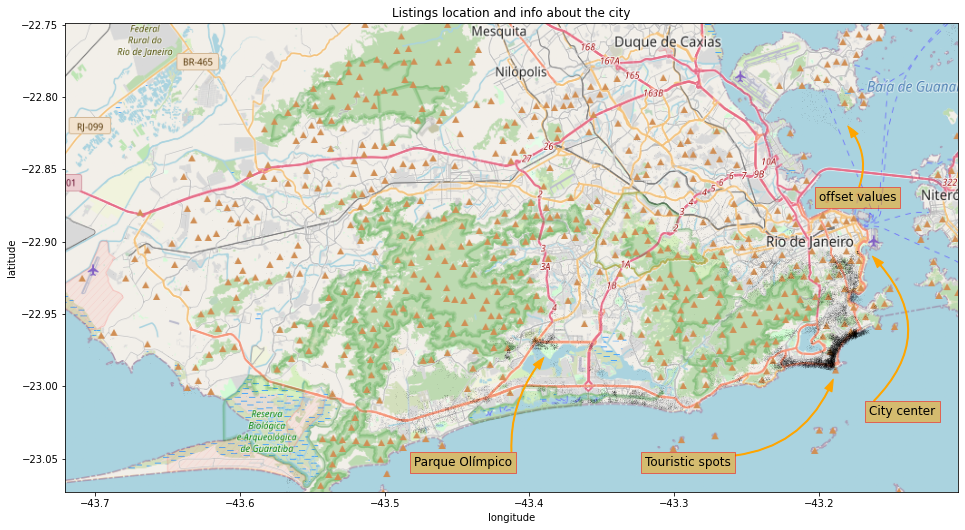

In [51]:
fig, ax= plt.subplots()
fig.set_size_inches(16,12)
a = plt.imread('https://i.ibb.co/52dDkxT/map-8.png')
ax.imshow(a,zorder=0, extent=(box[0],-43.1041,-23.082,box[3]), aspect='equal')
ax.set_title('Listings location and info about the city')
ax.set_xlim(box[0],box[1])
ax.set_ylim(box[2],box[3])#-23.0729
ax.annotate('offset values',
            xy=(-43.18, -22.82),
            xytext=(-43.2,-22.872), backgroundcolor='yellow',bbox=dict(facecolor='#ffa500', alpha=0.5, edgecolor='red', joinstyle='round'),
            arrowprops=dict(headwidth=8, width=1, color='#ffa500', connectionstyle="arc3, rad=0.3"),
            fontsize=12)
ax.annotate('Parque Olímpico',
            xy=(-43.39, -22.98),
            xytext=(-43.48,-23.055), backgroundcolor='yellow',bbox=dict(facecolor='#ffa500', alpha=0.5, edgecolor='red', joinstyle='round'),
            arrowprops=dict(headwidth=8, width=1, color='#ffa500', connectionstyle="arc3, rad=-0.2"),
            fontsize=12)
ax.annotate('City center',
            xy=(-43.163, -22.91),
            xytext=(-43.165,-23.02), backgroundcolor='yellow',bbox=dict(facecolor='#ffa500', alpha=0.5, edgecolor='red', joinstyle='round'),
            arrowprops=dict(headwidth=8, width=1, color='#ffa500', connectionstyle="arc3, rad=0.5"),
            fontsize=12)
ax.annotate('Touristic spots',
            xy=(-43.19, -22.995),
            xytext=(-43.32,-23.055), backgroundcolor='yellow',bbox=dict(facecolor='#ffa500', alpha=0.5, edgecolor='red', joinstyle='round'),
            arrowprops=dict(headwidth=8, width=1, color='#ffa500', connectionstyle="arc3, rad=0.3"),
            fontsize=12)
_ = sns.scatterplot(x='longitude', y='latitude', data=df, ax=ax, zorder=1,color='black',alpha=0.6, s=0.1,edgecolor=None)

### Encoding

We need to adjust the features for the model.

- Features True or False will be replaced by 1 and 0.  
- Dummy variables

In [40]:
#colunas cujo os valores são true or false
colunas_tf = ['host_is_superhost', 'instant_bookable','is_business_travel_ready' ]
df_airbnd_encoded = df_airbnd.copy()
for coluna in colunas_tf:
    df_airbnd_encoded.loc[df_airbnd_encoded[coluna] == 't', coluna] = 1
    df_airbnd_encoded.loc[df_airbnd_encoded[coluna] == 'f', coluna] = 0

print(df_airbnd_encoded.iloc[0])

host_is_superhost                     1
host_listings_count                 2.0
latitude                     -22.965919
longitude                    -43.178962
property_type               Condominium
accommodates                          5
bathrooms                           1.0
bedrooms                            2.0
beds                                2.0
bed_type                       Real Bed
price                             270.0
extra_people                       51.0
minimum_nights                        4
instant_bookable                      1
is_business_travel_ready              0
cancellation_policy              strict
year                               2018
month                                 4
n_amenities                          25
Name: 1, dtype: object


In [43]:
colunas_categorias = ['property_type','bed_type','cancellation_policy']
df_airbnd_encoded = pd.get_dummies(data = df_airbnd_encoded, columns = colunas_categorias)
display(df_airbnd_encoded.head(5))


,host_is_superhost,host_listings_count,latitude,longitude,accommodates,bathrooms,bedrooms,beds,price,extra_people,...,property_type_House,property_type_Loft,property_type_Others,property_type_Serviced apartment,bed_type_Others,bed_type_Real Bed,cancellation_policy_flexible,cancellation_policy_moderate,cancellation_policy_strict,cancellation_policy_strict_14_with_grace_period
1,1,2.0,-22.965919,-43.178962,5,1.0,2.0,2.0,270.0,51.0,...,0,0,0,0,0,1,0,0,1,0
3,0,3.0,-22.977117,-43.190454,3,1.0,1.0,2.0,161.0,45.0,...,0,0,0,0,0,1,0,0,1,0
4,1,1.0,-22.983024,-43.214270,3,1.0,1.0,2.0,222.0,68.0,...,0,0,0,0,0,1,0,0,1,0
5,1,1.0,-22.988165,-43.193588,3,1.5,1.0,2.0,308.0,86.0,...,0,0,0,0,0,1,0,0,1,0
6,1,1.0,-22.981269,-43.190457,2,1.0,1.0,2.0,219.0,80.0,...,0,1,0,0,0,1,0,0,1,0


### ML models

### Model Evaluation Metrics: R-Squared and RMSE

In [44]:
def avaliar_modelo(nome_modelo, y_teste, previsao):
    r2 = r2_score(y_teste, previsao)
    RSME = np.sqrt(mean_squared_error(y_test, previsao))
    return f'Modelo {nome_modelo}:\nR²:{r2:.2%}\nRMSE:{RSME:.2f}'

### Analysis of the best model

Here we will test the following models:
 - Random Forest
 - Linear reggression
 - Extra Tree

In [45]:
modelo_rf = RandomForestRegressor()
modelo_lr = LinearRegression()
modelo_et = ExtraTreesRegressor()

modelos = {'RandomForest':modelo_rf,
          'LinearRegression':modelo_lr,
          'ExtraTrees':modelo_et,
          }

y = df_airbnd_encoded['price']# define o eixo y
X = df_airbnd_encoded.drop('price', axis=1)# define o eixo x

- Spliting the data: train-test-validation

In [46]:
X_train, X_test, y_train, y_test = train_test_split(X, y, random_state = 10) 
# o parâmetro random_state garante que os mesmo números aleatórios vão ser gerados. 10 sementes??? Sem o random_state a divisão
#aleatória para treino e teste em X_train/test e y_train/test vai ser diferente para cada vez que o código for rodado o código.

for nome_modelo, modelo in modelos.items():
    #treinar
    modelo.fit(X_train, y_train)
    #testar
    previsao = modelo.predict(X_test)
    print(avaliar_modelo(nome_modelo, y_test, previsao))

Modelo RandomForest:
R²:97.18%
RMSE:44.55
Modelo LinearRegression:
R²:31.72%
RMSE:219.11
Modelo ExtraTrees:
R²:97.43%
RMSE:42.48


- As it can be seen, ExtraTrees is the best model. It is the one with higher R^2 (better fit) and lower RMSE. The second one is the RandomForest model. Both models are decision trees models.  


- The Linear Regression model didn't get satisfatory results. 

# Improving the model

,0
bedrooms,0.126779
latitude,0.109963
longitude,0.105753
accommodates,0.101698
extra_people,0.094306
n_amenities,0.092702
bathrooms,0.069262
minimum_nights,0.065320
beds,0.059075
host_listings_count,0.040408


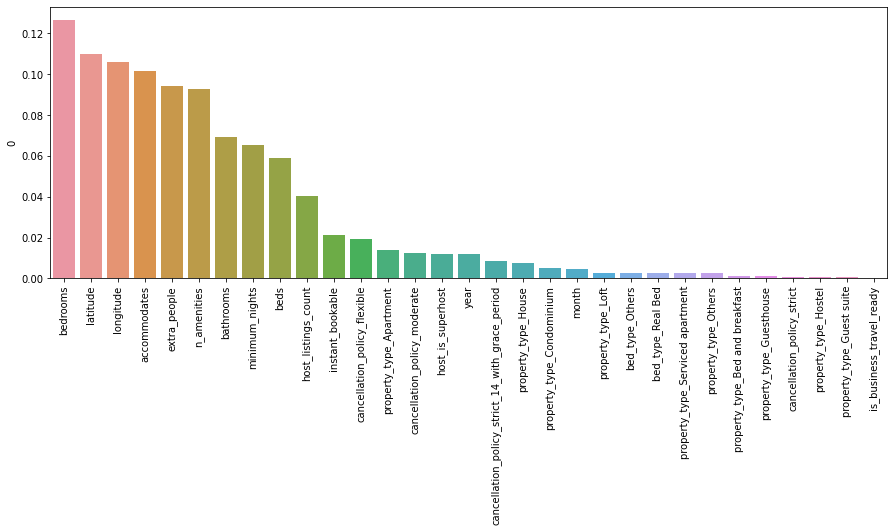

In [53]:
importancia_features = pd.DataFrame(modelo_et.feature_importances_, X_train.columns)
importancia_features = importancia_features.sort_values(by=0, ascending=False)
display(importancia_features)
plt.figure(figsize=(15, 5))
ax = sns.barplot(x=importancia_features.index, y=importancia_features[0])
ax.tick_params(axis='x', rotation=90)

### Final adjustments

- It seems that is_business_travel_ready does not have an impact in our model. Thus. we will drop the feature from our model to improve the model. 

In [55]:
base_airbnb_cod = df_airbnd_encoded.drop('is_business_travel_ready', axis=1)

y = base_airbnb_cod['price']
X = base_airbnb_cod.drop('price', axis=1)

X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=10)

modelo_et.fit(X_train, y_train)
previsao = modelo_et.predict(X_test)
reprint(avaliar_modelo('ExtraTrees', y_test, previsao))

Modelo ExtraTrees:
R²:97.44%
RMSE:42.41


- Removing bed_type

In [56]:
base_teste = df_airbnd_encoded.copy()
for coluna in base_teste:
    if 'bed_type' in coluna:    
        base_teste = base_teste.drop(coluna, axis=1)
print(base_teste.columns)
y = base_teste['price']
X = base_teste.drop('price', axis=1)

X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=10)

modelo_et.fit(X_train, y_train)
prediction = modelo_et.predict(X_test)
print(avaliar_modelo('ExtraTrees', y_test, previsao))

Index(['host_is_superhost', 'host_listings_count', 'latitude', 'longitude',
       'accommodates', 'bathrooms', 'bedrooms', 'beds', 'price',
       'extra_people', 'minimum_nights', 'instant_bookable',
       'is_business_travel_ready', 'year', 'month', 'n_amenities',
       'property_type_Apartment', 'property_type_Bed and breakfast',
       'property_type_Condominium', 'property_type_Guest suite',
       'property_type_Guesthouse', 'property_type_Hostel',
       'property_type_House', 'property_type_Loft', 'property_type_Others',
       'property_type_Serviced apartment', 'cancellation_policy_flexible',
       'cancellation_policy_moderate', 'cancellation_policy_strict',
       'cancellation_policy_strict_14_with_grace_period'],
      dtype='object')
Modelo ExtraTrees:
R²:97.44%
RMSE:42.41


- As it can be seen, removing bed_type didn't improve the model. 

### Printing the predictions:

In [57]:
print(prediction)

[100.98 990.52 249.17 ... 126.33 280.16 119.82]


In [58]:
X['price'] = y
X.to_csv('dados.csv')

In [59]:
import joblib
joblib.dump(modelo_et, 'modelo.joblib')

['modelo.joblib']